# **Notebook description:** This notebok contains three different models. 


Model-1 : This model uses text an dimage embeddings to recommend prompts <br>
Model-2: This model uses image embeddings to recommend prompts <br>
Model-3: Formation of similar user clusters and recommending based on similar user

Importing libraries

In [4]:
import pandas as pd
import numpy as np

In [5]:
!pip install Pillow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Downloading dataset to be used

In [ ]:
!pip install datasets

In [7]:
import numpy as np
from datasets import load_dataset

# Load the dataset with the `2m_first_5k` subset
# we need to download dataset every time, so do not use random!
# use '2m_first_5k' for the consistency among the models
# for me (Hyelim), it takes about 3 min to download
dataset = load_dataset('poloclub/diffusiondb', '2m_first_5k')

Generating train split: 0 examples [00:00, ? examples/s]

Dataset diffusiondb downloaded and prepared to /root/.cache/huggingface/datasets/poloclub___diffusiondb/2m_first_5k/0.9.1/547894e3a57aa647ead68c9faf148324098f47f2bc1ab6705d670721de9d89d1. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

Dataset visualization and feature engineering

In [8]:
my_5k_data = dataset['train']
df = pd.DataFrame( my_5k_data ) # this will take about 3 min too
df.head()

,image,prompt,seed,step,cfg,sampler,width,height,user_name,timestamp,image_nsfw,prompt_nsfw
0,<PIL.PngImagePlugin.PngImageFile image mode=RG...,"a renaissance portrait of dwayne johnson, art ...",2480545905,50,16.0,k_euler_ancestral,512,768,e9dfc969d22cb9c5621ad075b3826c28f18ef3840c6dda...,2022-08-20 05:28:00+00:00,0.163488,0.000793
1,<PIL.PngImagePlugin.PngImageFile image mode=RG...,"portrait of a dancing eagle woman, beautiful b...",2250159284,50,9.0,k_lms,512,640,aa60a36693bf9e079b421c1200fd42ed94061fb02078ad...,2022-08-20 05:28:00+00:00,0.276650,0.003090
2,<PIL.PngImagePlugin.PngImageFile image mode=RG...,"epic 3 d, become legend shiji! gpu mecha contr...",4292948605,50,7.0,k_lms,512,768,3e774662f24c78b0590d57365d755d7dacde8f33dbdc56...,2022-08-20 05:28:00+00:00,0.090421,0.000533
3,<PIL.PngImagePlugin.PngImageFile image mode=RG...,an airbrush painting of cyber war machine scen...,2374713726,50,12.0,k_lms,512,768,c2bd0b60caa0aa04d0a7e5972fefc60b21ece352d88353...,2022-08-20 05:29:00+00:00,0.078309,0.000597
4,<PIL.PngImagePlugin.PngImageFile image mode=RG...,concept art of a silent hill monster. painted ...,2320897141,50,6.0,k_lms,640,512,08ac4153ab7e13baa55ee74213eb117a29a0024267b29e...,2022-08-20 05:29:00+00:00,0.086802,0.083516


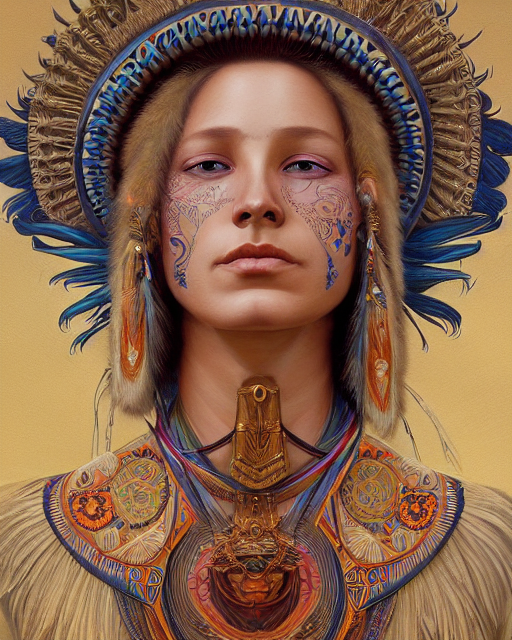

In [9]:
df['image'][6]

In [11]:
df['id'] = df.index
first_column = df.pop('id')
df.insert(0, 'id', first_column)
df.head()

,id,image,prompt,seed,step,cfg,sampler,width,height,user_name,timestamp,image_nsfw,prompt_nsfw
0,0,<PIL.PngImagePlugin.PngImageFile image mode=RG...,"a renaissance portrait of dwayne johnson, art ...",2480545905,50,16.0,k_euler_ancestral,512,768,e9dfc969d22cb9c5621ad075b3826c28f18ef3840c6dda...,2022-08-20 05:28:00+00:00,0.163488,0.000793
1,1,<PIL.PngImagePlugin.PngImageFile image mode=RG...,"portrait of a dancing eagle woman, beautiful b...",2250159284,50,9.0,k_lms,512,640,aa60a36693bf9e079b421c1200fd42ed94061fb02078ad...,2022-08-20 05:28:00+00:00,0.276650,0.003090
2,2,<PIL.PngImagePlugin.PngImageFile image mode=RG...,"epic 3 d, become legend shiji! gpu mecha contr...",4292948605,50,7.0,k_lms,512,768,3e774662f24c78b0590d57365d755d7dacde8f33dbdc56...,2022-08-20 05:28:00+00:00,0.090421,0.000533
3,3,<PIL.PngImagePlugin.PngImageFile image mode=RG...,an airbrush painting of cyber war machine scen...,2374713726,50,12.0,k_lms,512,768,c2bd0b60caa0aa04d0a7e5972fefc60b21ece352d88353...,2022-08-20 05:29:00+00:00,0.078309,0.000597
4,4,<PIL.PngImagePlugin.PngImageFile image mode=RG...,concept art of a silent hill monster. painted ...,2320897141,50,6.0,k_lms,640,512,08ac4153ab7e13baa55ee74213eb117a29a0024267b29e...,2022-08-20 05:29:00+00:00,0.086802,0.083516


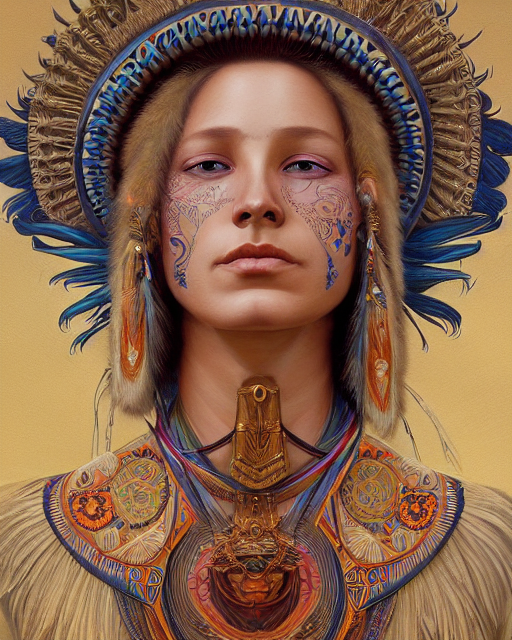

In [12]:
image = df['image'][6]
image

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Model-1 (Text + Image Embeddings)
**step 1.a: Create embeddings using text**




In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
df_h=pd.read_csv('/content/drive/MyDrive/cmpe-256-projectData/Preprocessed_prompts.csv')
temp2=df_h.copy()
temp2

,id,prompt,no_emojis,after_stemming
0,0,"a renaissance portrait of dwayne johnson, art ...","a renaissance portrait of dwayne johnson, art ...",renaiss portrait dwayn johnson art style rembr...
1,1,"portrait of a dancing eagle woman, beautiful b...","portrait of a dancing eagle woman, beautiful b...",portrait danc eagl woman beauti blond hair lak...
2,2,"epic 3 d, become legend shiji! gpu mecha contr...","epic 3 d, become legend shiji! gpu mecha contr...",epic becom legend shiji gpu mecha control tele...
3,3,an airbrush painting of cyber war machine scen...,an airbrush painting of cyber war machine scen...,airbrush paint cyber war machin scene area des...
4,4,concept art of a silent hill monster. painted ...,concept art of a silent hill monster. painted ...,concept art silent hill monster paint edward h...
...,...,...,...,...
4995,4995,interior view overlooking a spectacular incred...,interior view overlooking a spectacular incred...,interior view overlook spectacular incred beau...
4996,4996,"bob's burger in real life, realistic studio po...","bob's burger in real life, realistic studio po...",bob burger real life realist studio portrait p...
4997,4997,"sushi, photography, by albert bierstadt","sushi, photography, by albert bierstadt",sushi photographi albert bierstadt
4998,4998,a sky stream of white streamers in a sea of ch...,a sky stream of white streamers in a sea of ch...,sky stream white streamer sea cherri petal sta...


In [ ]:
def word_count(row):
  # temp = row[3]
  temp = str(row[3])
  print(temp)
  return len([s for s in temp.split(' ') if not s.isnumeric()])

temp2['word_count'] = temp2.apply(word_count, axis = 1)

In [ ]:
index_to_drop = df_h[df_h['after_stemming'] == ''].index

df_h.drop(index_to_drop , inplace=True)
index_to_drop = df_h[df_h['after_stemming'] == 'NaN'].index
# index_to_drop
index_to_drop=df_h[df_h['word_count'] < 2].index
df_h.drop(index_to_drop , inplace=True)


In [ ]:
v = TfidfVectorizer()
x = v.fit_transform(df_h['after_stemming'])
embeddings_text = x.toarray()

In [ ]:
df_temp = pd.DataFrame(x.toarray(), columns=v.get_feature_names_out())
df_temp.head()

,aardman,aaron,ab,abandon,abbott,abdomen,abel,abercrombi,abomin,aborigin,...,zuckerberg,zull,zulu,zurbaran,ʻaʻa,беляева,сat,светлана,サイハーハンク,ハイネ
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
max_values = df_temp.max().to_numpy()
print(max(max_values))
print(min(max_values))

1.0
0.1448354558835773


In [ ]:
id_prompt_dic = temp['prompt'].to_dict()
id_prompt_dic[1]

'portrait of a dancing eagle woman, beautiful blonde haired lakota sioux goddess, intricate, highly detailed art by james jean, ray tracing, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm and greg rutkowski and alphonse mucha, vladimir kush, giger, 8 k '

**Step 1.b: Create image embeddings using InceptionV3 model**

In [ ]:
import tensorflow_hub as hub
from PIL import Image
import os
import numpy as np
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model

# Load the InceptionV3 model
model_h = InceptionV3(weights='imagenet', include_top=False)
print(model_h.summary())

2023-04-27 15:59:17.323500: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-27 15:59:18.748376: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_INVALID_VALUE: invalid argument
2023-04-27 15:59:18.748402: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:168] retrieving CUDA diagnostic information for host: wencen-wu-alienware
2023-04-27 15:59:18.748407: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:175] hostname: wencen-wu-alienware
2023-04-27 15:59:18.748449: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:199] libcuda reported version is: NOT_FOUND: was unable to find libcuda.so DSO loaded into this program
2023-04-27 15:59:18.748467: I

87910968/87910968 [==============================] - 8s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)           

In [ ]:
IMAGE_SHAPE = (224, 224)
def extract(file):
  file = Image.open(file).convert('L').resize(IMAGE_SHAPE)
  file = np.stack((file,)*3, axis=-1)
  file = np.array(file)/255.0

  embedding = model_h.predict(file[np.newaxis, ...])
  vgg16_feature_np = np.array(embedding)
  flattended_feature = vgg16_feature_np.flatten()

  return flattended_feature

In [ ]:
import os
 # assuming you have a function called 'extract' that takes an image filename as input and returns the embeddings

# Set up the path to the image folder
folder_path = "/home/wencen_wu/Downloads/content/Hyelim_first_5k_images"


# Load the filenames of the images in the folder
img_filenames = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')]

# Set up arrays to store the image embeddings and filenames
embeddings_image = []
filenames = []

# Loop over the image filenames and extract the embeddings
for filename in img_filenames:
    
    # Call the 'extract' function on the image
    embedding = extract(filename)
    
    # Add the embedding and filename to the arrays
    embeddings_image.append(embedding)
    filenames.append(filename)

# Use the image embeddings and filenames for your desired task
# ...
embeddings_image


**Step 1.c: Finding cosine similairty from both combined embedding**

In [ ]:
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from sklearn.metrics.pairwise import cosine_similarity



# Combine embeddings
combined_embeddings = np.concatenate((embeddings_text, embeddings_image), axis=1)
combined_embeddings = combined_embeddings / np.linalg.norm(combined_embeddings, axis=1)[:, None]
print(combined_embeddings)
# Calculate cosine similarity
similarity_matrix = cosine_similarity(combined_embeddings)
print(similarity_matrix)


[[0.         0.         0.         ... 0.         0.00222153 0.        ]
 [0.         0.         0.         ... 0.00705506 0.00855926 0.        ]
 [0.         0.         0.         ... 0.         0.0057852  0.00016932]
 ...
 [0.         0.         0.         ... 0.0049947  0.00412479 0.00015115]
 [0.         0.         0.         ... 0.         0.00280549 0.00567178]
 [0.         0.         0.         ... 0.         0.         0.00692341]]
[[1.         0.33586833 0.34063928 ... 0.33385556 0.3683284  0.31677635]
 [0.33586833 1.         0.29373521 ... 0.36774582 0.36621418 0.31752912]
 [0.34063928 0.29373521 1.         ... 0.33273187 0.31355561 0.3919748 ]
 ...
 [0.33385556 0.36774582 0.33273187 ... 1.         0.35550381 0.34482629]
 [0.3683284  0.36621418 0.31355561 ... 0.35550381 1.         0.27278235]
 [0.31677635 0.31752912 0.3919748  ... 0.34482629 0.27278235 1.        ]]


In [19]:
similarity_matrix

,index,0,1,2,3,4,5,6,7,8,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
0,0,1.000000,0.335868,0.340639,0.333695,0.319815,0.336406,0.319133,0.339480,0.288963,...,0.307803,0.397171,0.280548,0.351371,0.312033,0.351212,0.351535,0.333856,0.368328,0.316776
1,1,0.335868,1.000000,0.293735,0.350205,0.257142,0.389351,0.332074,0.397520,0.295801,...,0.394574,0.360643,0.324604,0.395757,0.353504,0.436430,0.374940,0.367746,0.366214,0.317529
2,2,0.340639,0.293735,1.000000,0.337351,0.342950,0.307485,0.315600,0.310919,0.311884,...,0.304241,0.299493,0.267555,0.302531,0.278214,0.314260,0.322356,0.332732,0.313556,0.391975
3,3,0.333695,0.350205,0.337351,1.000000,0.316604,0.353427,0.380974,0.352612,0.387483,...,0.386006,0.310978,0.279548,0.321343,0.331737,0.347738,0.361557,0.349593,0.402199,0.318103
4,4,0.319815,0.257142,0.342950,0.316604,1.000000,0.268562,0.307682,0.251030,0.309974,...,0.265501,0.272668,0.298859,0.268792,0.275969,0.297623,0.283812,0.281741,0.325842,0.373789
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4995,0.351212,0.436430,0.314260,0.347738,0.297623,0.371159,0.332370,0.367131,0.323781,...,0.369624,0.350516,0.310485,0.388140,0.340549,1.000000,0.359184,0.385452,0.325991,0.356999
4996,4996,0.351535,0.374940,0.322356,0.361557,0.283812,0.425775,0.358948,0.515558,0.350359,...,0.352409,0.336228,0.314961,0.353008,0.337850,0.359184,1.000000,0.411046,0.352124,0.372090
4997,4997,0.333856,0.367746,0.332732,0.349593,0.281741,0.403338,0.355154,0.375979,0.328807,...,0.348319,0.376887,0.327704,0.416041,0.320846,0.385452,0.411046,1.000000,0.355504,0.344826
4998,4998,0.368328,0.366214,0.313556,0.402199,0.325842,0.332665,0.340676,0.349215,0.323582,...,0.332912,0.355675,0.319562,0.356177,0.415589,0.325991,0.352124,0.355504,1.000000,0.272782


In [ ]:
# create a function to select top-N prompts 
def similar_prompts(topN, sim_mat, ID):
  """
  --- Inputs ---
  topN: the number of prompts to be recommended
  sim_mat: similarity matrix. This should be square matrix
  ID: id of prompt
  --- Output ---
  original prompt
  topN similar prompts
  """
  temp_prompt = sim_mat[ID]
  index_after_sort = np.argsort(temp_prompt)[:topN]
  recommendation = []
  print('The input prompt: ', id_prompt_dic[ID])
  for i in index_after_sort:
    print('Recommended prompt: ', id_prompt_dic[i])
    display(df['image'][i])
    recommendation.append((i, id_prompt_dic[i]))
  return id_prompt_dic[ID], recommendation


# Showing results from model-1

---



In [39]:
!unzip /content/drive/MyDrive/cmpe-256-projectData/Hyelim_first_5k_images_all.zip -d /content/drive/MyDrive/cmpe-256-projectData/Untitled Folder

Archive:  /content/drive/MyDrive/cmpe-256-projectData/Hyelim_first_5k_images_all.zip
caution: filename not matched:  Folder


In [16]:
import numpy as np

# Load CSV file
data = np.genfromtxt('/content/drive/MyDrive/cmpe-256-projectData/similarity_matrix_image_text.csv', delimiter=',')

# Save as NPY file
np.save('image_similairty_file.npy', data)


In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# read the similarity matrix from CSV file
similarity_df = pd.read_csv('/content/drive/MyDrive/cmpe-256-projectData/similarity_matrix_image_text.csv', index_col=0)
similarity_df

,0,1,2,3,4,5,6,7,8,9,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
0,1.000000,0.335872,0.340646,0.333702,0.319825,0.336396,0.319139,0.339485,0.288968,0.347198,...,0.307807,0.397179,0.280552,0.351377,0.312038,0.351217,0.351539,0.333860,0.368334,0.316781
1,0.335872,1.000001,0.293741,0.350212,0.257149,0.389356,0.332062,0.397526,0.295806,0.418527,...,0.394580,0.360650,0.324609,0.395766,0.353509,0.436437,0.374945,0.367751,0.366220,0.317534
2,0.340646,0.293741,1.000001,0.337360,0.342963,0.307491,0.315609,0.310925,0.311891,0.279523,...,0.304248,0.299501,0.267561,0.302539,0.278220,0.314267,0.322362,0.332738,0.313563,0.391983
3,0.333702,0.350212,0.337360,1.000000,0.316616,0.353434,0.380985,0.352619,0.387492,0.322828,...,0.386015,0.310987,0.279554,0.321351,0.331745,0.347746,0.361565,0.349600,0.402207,0.318110
4,0.319825,0.257149,0.342963,0.316616,1.000000,0.268570,0.307692,0.251039,0.309985,0.255259,...,0.265510,0.272677,0.298868,0.268803,0.275978,0.297632,0.283821,0.281750,0.325853,0.373802
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.351217,0.436437,0.314267,0.347746,0.297632,0.371165,0.332377,0.367137,0.323788,0.436217,...,0.369631,0.350508,0.310490,0.388147,0.340555,1.000000,0.359190,0.385458,0.325996,0.357006
4996,0.351539,0.374945,0.322362,0.361565,0.283821,0.425780,0.358955,0.515566,0.350364,0.318752,...,0.352413,0.336234,0.314964,0.353014,0.337856,0.359190,1.000000,0.411052,0.352129,0.372096
4997,0.333860,0.367751,0.332738,0.349600,0.281750,0.403343,0.355162,0.375984,0.328813,0.328210,...,0.348324,0.376894,0.327708,0.416050,0.320851,0.385458,0.411052,0.999999,0.355509,0.344832
4998,0.368334,0.366220,0.313563,0.402207,0.325853,0.332670,0.340683,0.349221,0.323588,0.334054,...,0.332917,0.355682,0.319567,0.356184,0.415580,0.325996,0.352129,0.355509,1.000001,0.272788


In [ ]:
import pandas as pd
import numpy as np

# load similarity matrix from CSV
similarity_matrix_image = pd.read_csv('/content/drive/MyDrive/cmpe-256-projectData/similarity_matrix_image_text.csv', index_col=0).values

In [60]:
index = 412 # index of the image you want to find similar images for
similar_images_indices = np.argsort(similarity_matrix[index])[::-1][:5]  # top 5, including itself
similar_images = df.iloc[similar_images_indices]
similar_images

,id,image,prompt,seed,step,cfg,sampler,width,height,user_name,timestamp,image_nsfw,prompt_nsfw
412,412,<PIL.PngImagePlugin.PngImageFile image mode=RG...,a man reclines in a gaming computer chair wear...,1919639174,50,9.0,k_lms,512,640,b8c2a3b93db268c5077802c05bd86c26dd9e9046dbfc7f...,2022-08-20 01:44:00+00:00,0.154990,0.003601
4,4,<PIL.PngImagePlugin.PngImageFile image mode=RG...,concept art of a silent hill monster. painted ...,2320897141,50,6.0,k_lms,640,512,08ac4153ab7e13baa55ee74213eb117a29a0024267b29e...,2022-08-20 05:29:00+00:00,0.086802,0.083516
4246,4246,<PIL.PngImagePlugin.PngImageFile image mode=RG...,"kodak portra 4 0 0, flashlight, muted colours,...",1872559955,50,13.0,k_lms,832,832,e69825f7c9c19b287c9ee282310550fdbea5cabf783410...,2022-08-18 14:41:00+00:00,0.059392,0.000250
789,789,<PIL.PngImagePlugin.PngImageFile image mode=RG...,head and torso portrait of beautiful mature wo...,1971697400,50,7.0,k_lms,512,704,ac2524ee4169c7f644f783de87f9bbfb96fa68b6e116df...,2022-08-19 23:17:00+00:00,0.090429,0.002152
398,398,<PIL.PngImagePlugin.PngImageFile image mode=RG...,a frontal drawing of a vertical space rocket c...,1582450972,50,7.0,k_lms,512,512,dc2163a1ed7922b5298061324ee204ee3ff42bc7abacd5...,2022-08-20 03:42:00+00:00,0.143970,0.000695


Here we are getting 5 top similar images and most similar is same as query image. It shows our model is working good.

In [66]:
df['prompt'][412]

'a man reclines in a gaming computer chair weargin a vr headset and headphones holding a game controller, in a domestic interior filled with screens by james jean and luc tuymans and beeple and hernan bas and pat steir and hilma af klint, psychological, 3 d, dripping paint, high quality render, masterpiece '

Recommended prompts based on similar images: a man reclines in a gaming computer chair weargin a vr headset and headphones holding a game controller, in a domestic interior filled with screens by james jean and luc tuymans and beeple and hernan bas and pat steir and hilma af klint, psychological, 3 d, dripping paint, high quality render, masterpiece 


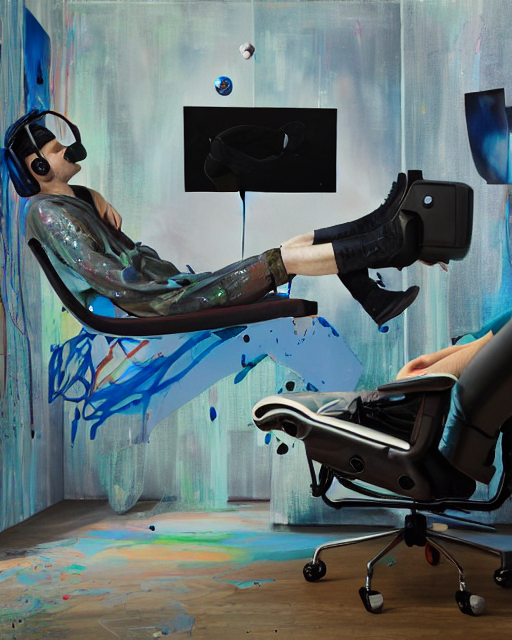

In [65]:
print('Recommended prompts based on similar images:', df['prompt'][412])
df['image'][412]

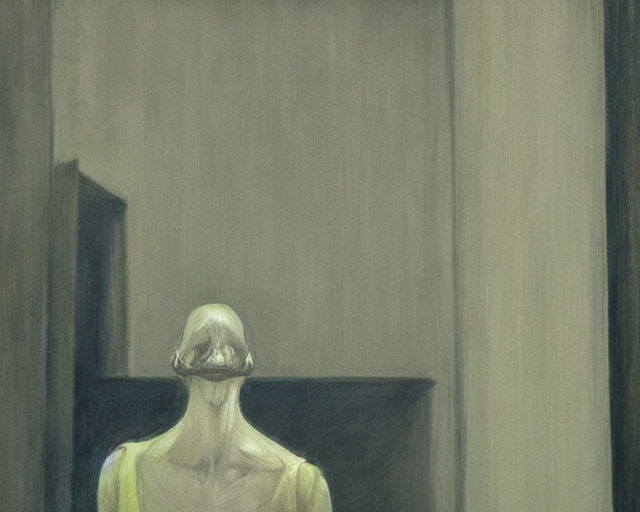

In [62]:
df['image'][4]

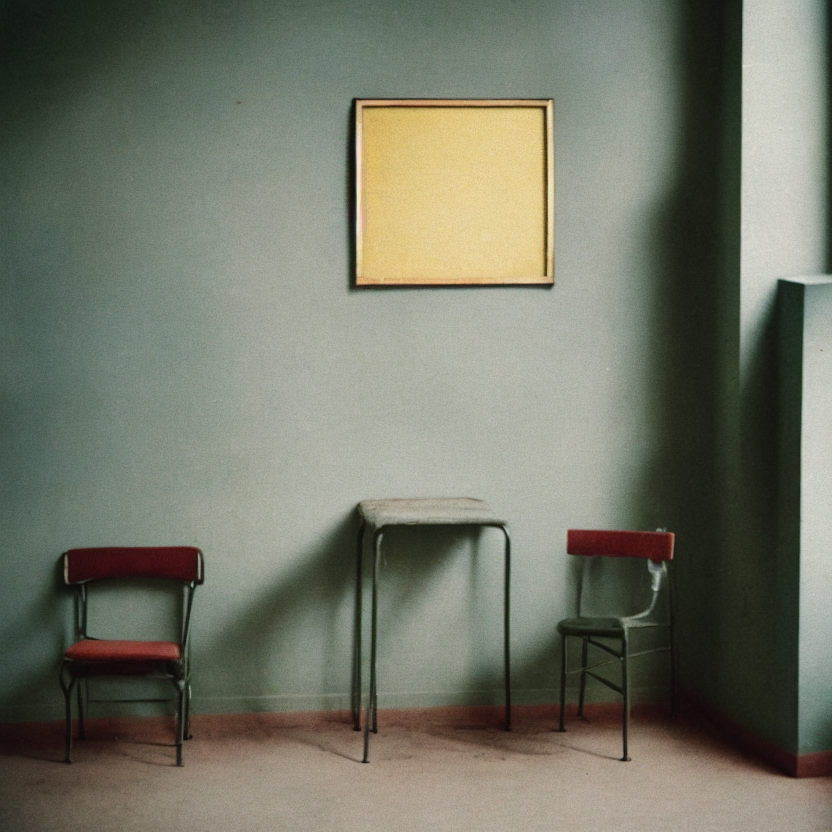

In [63]:
df['image'][4246]

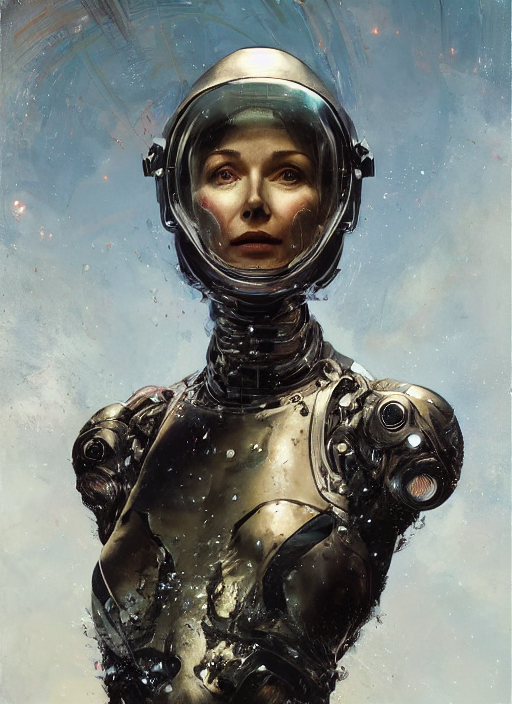

In [64]:
df['image'][789]

Example Two of Image based Recommendation

# Note- In Below table, most similar prompt is same as query prompt, which shows model is working correctly

In [45]:
index = 3654 # index of the image you want to find similar images for
similar_images_indices = np.argsort(similarity_matrix_image[index])[::-1][:5]  # top 5, including itself
similar_images = df.iloc[similar_images_indices]
similar_images

,image,prompt,seed,step,cfg,sampler,width,height,user_name,timestamp,image_nsfw,prompt_nsfw
3654,<PIL.PngImagePlugin.PngImageFile image mode=RG...,weirdest cute critters surreal art digital pai...,594579217,50,7.0,k_lms,640,512,db6c3dd0cff968a4757de048ccbea6db8ac811e32db64c...,2022-08-18 22:21:00+00:00,0.728894,0.067888
954,<PIL.PngImagePlugin.PngImageFile image mode=RG...,scifi cyberpunk mysterious local market on the...,1388368621,50,11.0,k_lms,704,512,5d9db681b4c3afd08e53be1e5b09e7c0df4c233c7bba0c...,2022-08-19 22:38:00+00:00,0.053569,0.000614
1133,<PIL.PngImagePlugin.PngImageFile image mode=RG...,"photograph of young steampunk orphan annie, re...",365059333,50,7.0,k_lms,512,512,79ffc3b4439c541eb9a0da90b45ab180ee0444ee559137...,2022-08-19 20:14:00+00:00,0.665365,0.003263
1720,<PIL.PngImagePlugin.PngImageFile image mode=RG...,beautiful spirit giraffe cheetah hybrid mixed ...,3206097364,50,7.0,k_lms,512,512,1fb38083263dfdf3fd5684d6407016e0357bebd5c3c45f...,2022-08-19 16:00:00+00:00,0.075806,0.000740
1826,<PIL.PngImagePlugin.PngImageFile image mode=RG...,"a full body portrait of cat girl, high detail,...",786035505,50,14.0,k_lms,512,768,c231b71bc3bf6999260fc1c52b793898966592500a13fa...,2022-08-19 16:49:00+00:00,2.000000,0.000670


Query prompts: weirdest cute critters surreal art digital painting 


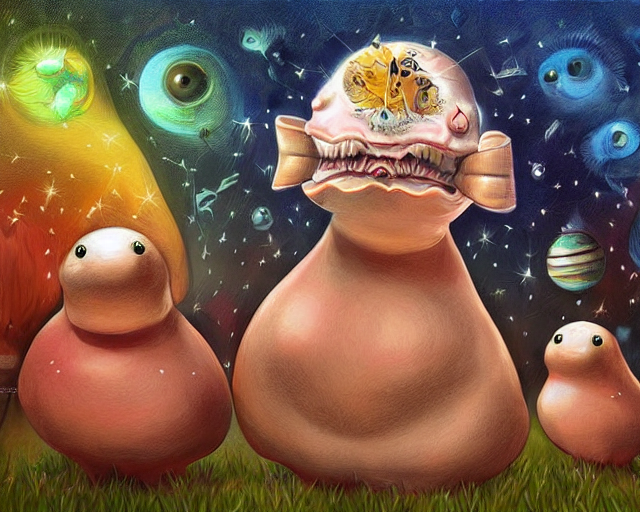

In [42]:
print('Query prompts:', df['prompt'][3654])
df['image'][3654]

Recommended prompts based on similar images: scifi cyberpunk mysterious local market on the river side downtown ; clear composition by sparth, golden hours, by william barlowe and pascal blanche and tom bagshaw and elsa beskow and enki bilal and franklin booth / neon rainbow vivid colors smooth, liquid, curves, very fine high detail wide lens 3 5 mm film 


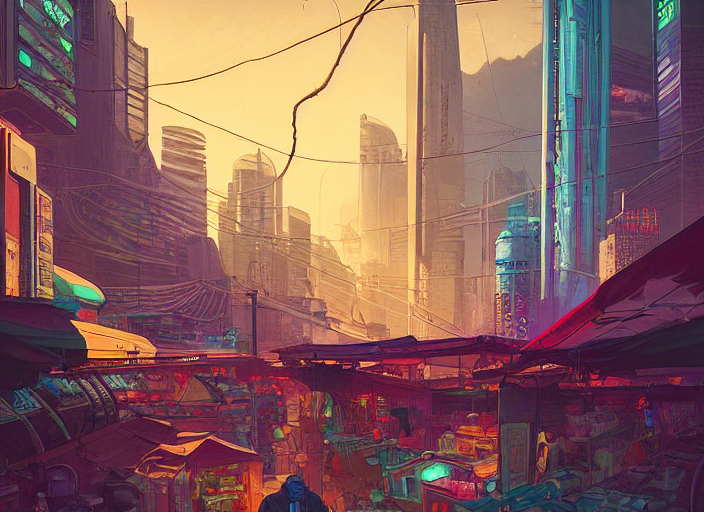

In [43]:
print('Recommended prompts based on similar images:', df['prompt'][954])
df['image'][954]

Recommended prompts based on similar images: photograph of young steampunk orphan annie, red dress, freckles, spunky attitude, city character portrait, in the style of moebius, tom bagshaw, and waterhouse, cinematic lighting artstation, oil painting, 


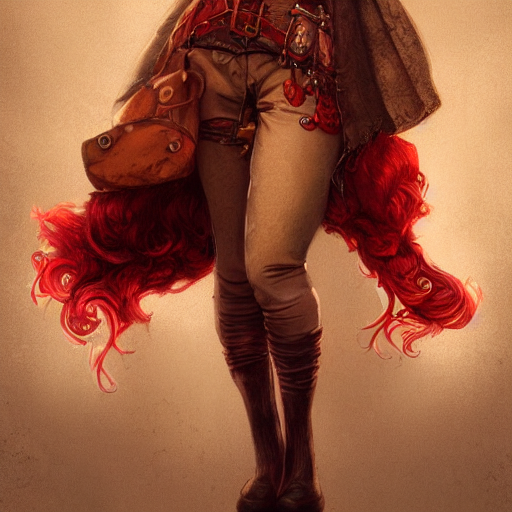

In [46]:
print('Recommended prompts based on similar images:', df['prompt'][1133])
df['image'][1133]

Recommended prompts based on similar images: beautiful spirit giraffe cheetah hybrid mixed creature character concept, with long flowing fur blowing in the wind, three quarter profile view, detailed painting, renaissance, 4 k 


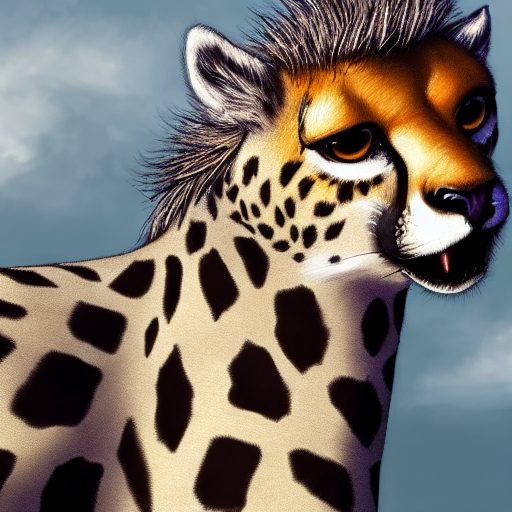

In [47]:
print('Recommended prompts based on similar images:', df['prompt'][1720])
df['image'][1720]

Model-2 hs- Embeddings combined by text and image

In [ ]:
combined_embeddings.to_csv("/content/drive/MyDrive/combined_embaddind.csv")

# Model-2: 
This model is based on image to image similairty, Firstly, I have used Inception V3 model (Also used in model-1) to get Image embeddings, Then used cosine similairty to find similarity matrix. 

I have used computer engineering lab for this model because it is working with images and taking hours to generate result, I have saved result in similarity matrix and used it here to show results.

In [24]:
import pandas as pd
import numpy as np

# load similarity matrix from CSV
similarity_matrix_combined = pd.read_csv('/content/drive/MyDrive/cmpe-256-projectData/similarity_matrix_images.csv', index_col=0).values

In [25]:
similarity_matrix_images

array([[1.        , 0.33586833, 0.34063928, ..., 0.33385556, 0.3683284 ,
        0.31677635],
       [0.33586833, 1.        , 0.29373521, ..., 0.36774582, 0.36621418,
        0.31752912],
       [0.34063928, 0.29373521, 1.        , ..., 0.33273187, 0.31355561,
        0.3919748 ],
       ...,
       [0.33385556, 0.36774582, 0.33273187, ..., 1.        , 0.35550381,
        0.34482629],
       [0.3683284 , 0.36621418, 0.31355561, ..., 0.35550381, 1.        ,
        0.27278235],
       [0.31677635, 0.31752912, 0.3919748 , ..., 0.34482629, 0.27278235,
        1.        ]])

# Showing results from model-2

Query prompt: weirdest cute critters surreal art digital painting 


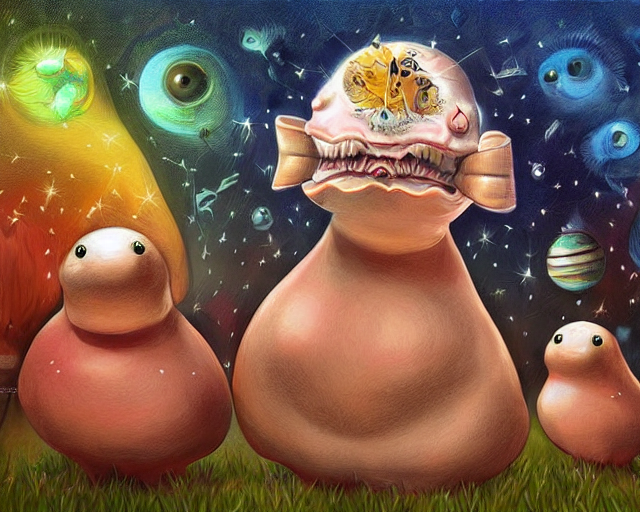

In [35]:
print('Query prompt:',df['prompt'][3654])
df['image'][3654]

In [30]:
index = 3654 # index of the image you want to find similar images for
similar_images_indices = np.argsort(similarity_matrix_images[index])[::-1][:5]  # top 5, including itself
similar_images = df.iloc[similar_images_indices]
similar_images

,image,prompt,seed,step,cfg,sampler,width,height,user_name,timestamp,image_nsfw,prompt_nsfw
3654,<PIL.PngImagePlugin.PngImageFile image mode=RG...,weirdest cute critters surreal art digital pai...,594579217,50,7.0,k_lms,640,512,db6c3dd0cff968a4757de048ccbea6db8ac811e32db64c...,2022-08-18 22:21:00+00:00,0.728894,0.067888
954,<PIL.PngImagePlugin.PngImageFile image mode=RG...,scifi cyberpunk mysterious local market on the...,1388368621,50,11.0,k_lms,704,512,5d9db681b4c3afd08e53be1e5b09e7c0df4c233c7bba0c...,2022-08-19 22:38:00+00:00,0.053569,0.000614
1133,<PIL.PngImagePlugin.PngImageFile image mode=RG...,"photograph of young steampunk orphan annie, re...",365059333,50,7.0,k_lms,512,512,79ffc3b4439c541eb9a0da90b45ab180ee0444ee559137...,2022-08-19 20:14:00+00:00,0.665365,0.003263
1720,<PIL.PngImagePlugin.PngImageFile image mode=RG...,beautiful spirit giraffe cheetah hybrid mixed ...,3206097364,50,7.0,k_lms,512,512,1fb38083263dfdf3fd5684d6407016e0357bebd5c3c45f...,2022-08-19 16:00:00+00:00,0.075806,0.000740
1826,<PIL.PngImagePlugin.PngImageFile image mode=RG...,"a full body portrait of cat girl, high detail,...",786035505,50,14.0,k_lms,512,768,c231b71bc3bf6999260fc1c52b793898966592500a13fa...,2022-08-19 16:49:00+00:00,2.000000,0.000670


Recommend prompt: scifi cyberpunk mysterious local market on the river side downtown ; clear composition by sparth, golden hours, by william barlowe and pascal blanche and tom bagshaw and elsa beskow and enki bilal and franklin booth / neon rainbow vivid colors smooth, liquid, curves, very fine high detail wide lens 3 5 mm film 


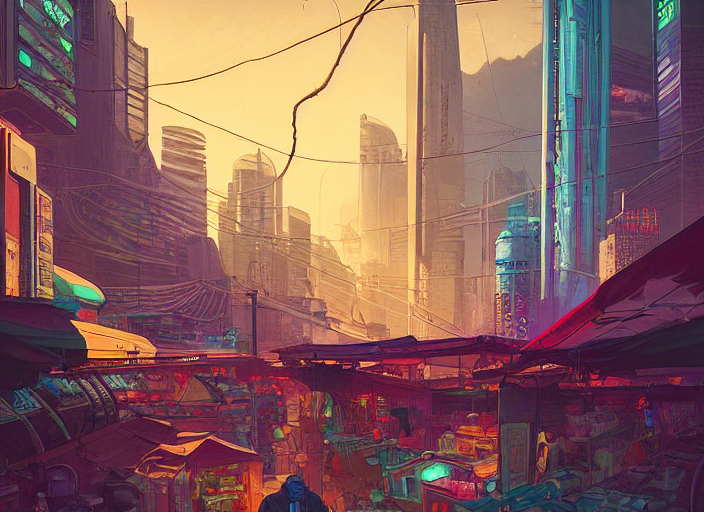

In [33]:
print('Recommend prompt:',df['prompt'][954])
df['image'][954]

Recommendated prompt: photograph of young steampunk orphan annie, red dress, freckles, spunky attitude, city character portrait, in the style of moebius, tom bagshaw, and waterhouse, cinematic lighting artstation, oil painting, 


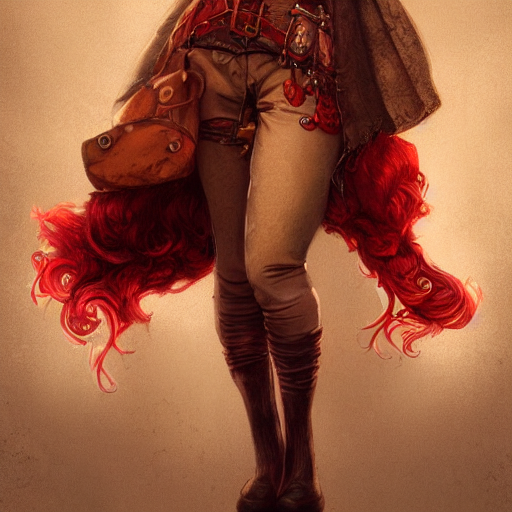

In [38]:
print('Recommendated prompt:',df['prompt'][1133])
df['image'][1133]

Recommended prompt: beautiful spirit giraffe cheetah hybrid mixed creature character concept, with long flowing fur blowing in the wind, three quarter profile view, detailed painting, renaissance, 4 k 


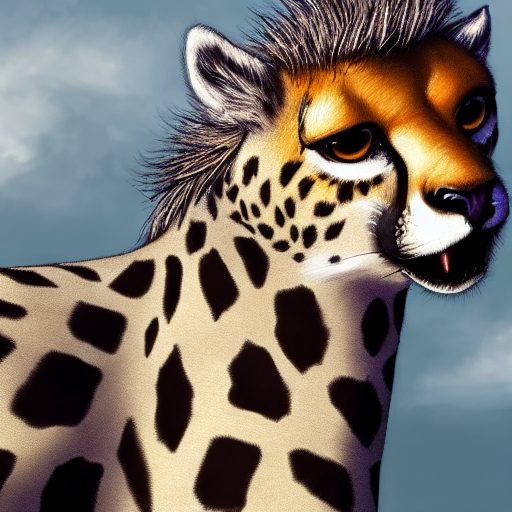

In [37]:
print('Recommended prompt:',df['prompt'][1720])
df['image'][1720]

In [ ]:
similarlity=pd.read_csv('/home/wencen_wu/Downloads/similarity_matrix.csv')

In [ ]:
fulldata=pd.read_csv('/home/wencen_wu/Downloads/Hyelim_5k_pre_processed.csv',index_col=0)

In [ ]:
similarlity

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
0,0,1.000000,0.335868,0.340639,0.333695,0.319815,0.336406,0.319133,0.339480,0.288963,...,0.307803,0.397171,0.280548,0.351371,0.312033,0.351212,0.351535,0.333856,0.368328,0.316776
1,1,0.335868,1.000000,0.293735,0.350205,0.257142,0.389351,0.332074,0.397520,0.295801,...,0.394574,0.360643,0.324604,0.395757,0.353504,0.436430,0.374940,0.367746,0.366214,0.317529
2,2,0.340639,0.293735,1.000000,0.337351,0.342950,0.307485,0.315600,0.310919,0.311884,...,0.304241,0.299493,0.267555,0.302531,0.278214,0.314260,0.322356,0.332732,0.313556,0.391975
3,3,0.333695,0.350205,0.337351,1.000000,0.316604,0.353427,0.380974,0.352612,0.387483,...,0.386006,0.310978,0.279548,0.321343,0.331737,0.347738,0.361557,0.349593,0.402199,0.318103
4,4,0.319815,0.257142,0.342950,0.316604,1.000000,0.268562,0.307682,0.251030,0.309974,...,0.265501,0.272668,0.298859,0.268792,0.275969,0.297623,0.283812,0.281741,0.325842,0.373789
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4995,0.351212,0.436430,0.314260,0.347738,0.297623,0.371159,0.332370,0.367131,0.323781,...,0.369624,0.350516,0.310485,0.388140,0.340549,1.000000,0.359184,0.385452,0.325991,0.356999
4996,4996,0.351535,0.374940,0.322356,0.361557,0.283812,0.425775,0.358948,0.515558,0.350359,...,0.352409,0.336228,0.314961,0.353008,0.337850,0.359184,1.000000,0.411046,0.352124,0.372090
4997,4997,0.333856,0.367746,0.332732,0.349593,0.281741,0.403338,0.355154,0.375979,0.328807,...,0.348319,0.376887,0.327704,0.416041,0.320846,0.385452,0.411046,1.000000,0.355504,0.344826
4998,4998,0.368328,0.366214,0.313556,0.402199,0.325842,0.332665,0.340676,0.349215,0.323582,...,0.332912,0.355675,0.319562,0.356177,0.415589,0.325991,0.352124,0.355504,1.000000,0.272782


# Model-3 
This model uses similarity matrix to group the users together based on the similarity of their prompts. It uses K means algorithm to form cluster. These clusters are further used to recommend prompts to the user belonging to same cluster.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances

# Compute user-user similarity matrix
similarity_matrix = most_prompts

# Convert similarity matrix to distance matrix
distance_matrix = 1 - similarity_matrix

# Perform k-means clustering with k=5
kmeans = KMeans(n_clusters=10)
clusters = kmeans.fit_predict(distance_matrix)

# Assign each user to a cluster
user_cluster_df = pd.DataFrame({'user': usersname, 'cluster': clusters})



/home/wencen_wu/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


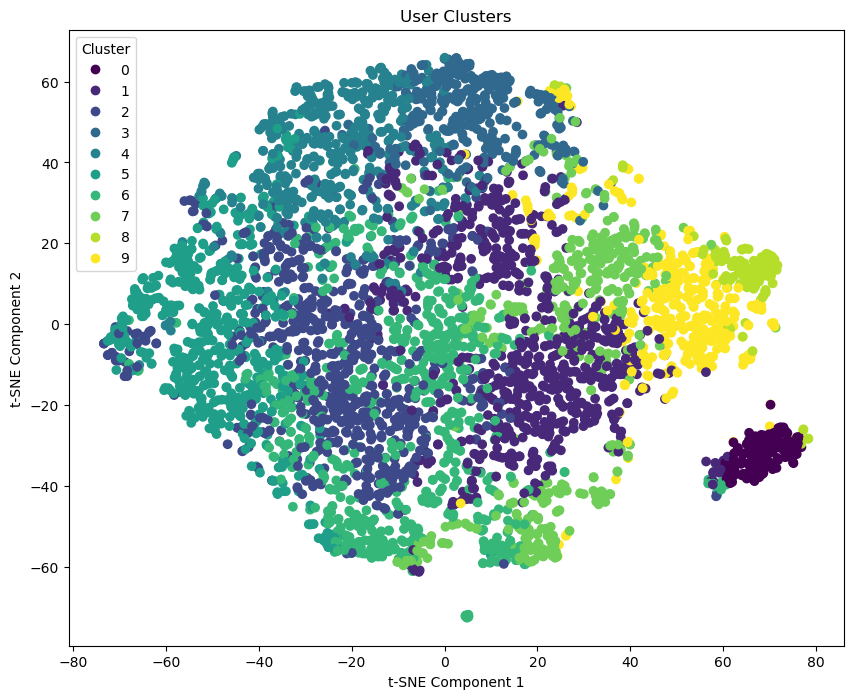

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Reduce the dimensionality of the cluster assignments using t-SNE
tsne = TSNE(n_components=2)
cluster_tsne = tsne.fit_transform(distance_matrix)

# Create a scatter plot of the clustered users
plt.figure(figsize=(10, 8))
scatter = plt.scatter(cluster_tsne[:, 0], cluster_tsne[:, 1], c=clusters, cmap='viridis')
plt.legend(*scatter.legend_elements(), title='Cluster')
plt.title('User Clusters')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [ ]:
# create a dictionary that maps prompt indices to user names
index_to_user = dict(enumerate(fulldata['id'].values))

# create a dictionary that maps prompt indices to the names of users who wrote them
prompt_to_user = {i: index_to_user[i] for i in range(len(fulldata))}



In [ ]:
index_to_user

In [ ]:
# group the users by their most similar prompt
grouped_users = {}
for prompt_index, similar_prompt_index in similarlity.items():
    similar_users = set(fulldata.loc[similar_prompt_index, 'user_name'])
    prompt_users = set(fulldata.loc[prompt_index, 'user_name'])
    shared_users = similar_users.intersection(prompt_users)
    if similar_prompt_index not in grouped_users:
        grouped_users[similar_prompt_index] = shared_users
    else:
        grouped_users[similar_prompt_index].update(shared_users)




In [ ]:
# print the groups of users who searched for similar prompts
for prompt_index, users in grouped_users.items():
    print(f"Users who searched for prompts similar to {prompt_to_user[prompt_index]}: {users}")